In [ ]:
!unzip /content/archive.zip

Archive:  /content/archive.zip
  inflating: netflix_titles.csv      


In [ ]:
import pandas as pd

df = pd.read_csv('netflix_titles.csv')

In [ ]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [ ]:
pd.to_datetime(df['date_added']).max()

Timestamp('2021-09-25 00:00:00')

In [ ]:
pd.to_datetime(df['date_added']).dt.year.value_counts()

2019.0    2016
2020.0    1879
2018.0    1649
2021.0    1498
2017.0    1188
2016.0     429
2015.0      82
2014.0      24
2011.0      13
2013.0      11
2012.0       3
2009.0       2
2008.0       2
2010.0       1
Name: date_added, dtype: int64

In [ ]:
df['date_added'] = pd.to_datetime(df['date_added'])

In [ ]:
df[df['date_added'].dt.year>2014]['title'].head()

0     Dick Johnson Is Dead
1            Blood & Water
2                Ganglands
3    Jailbirds New Orleans
4             Kota Factory
Name: title, dtype: object

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [ ]:
titles = ' '.join(df[df['date_added'].dt.year>2014]['title'])

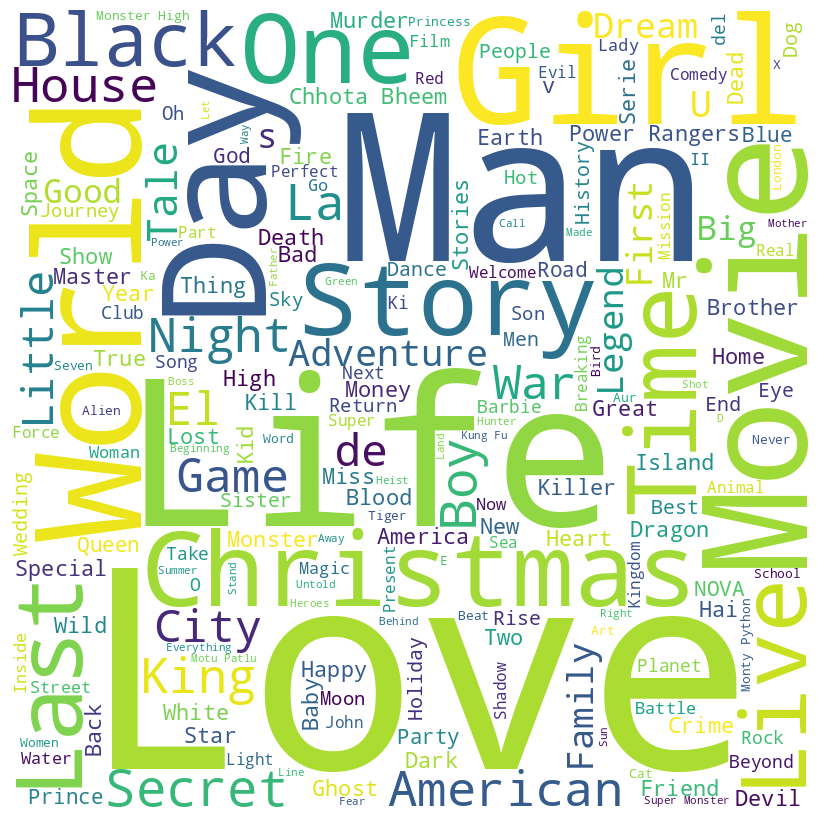

In [ ]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = STOPWORDS,
                min_font_size = 10).generate(titles)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

In [ ]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = STOPWORDS,
                min_font_size = 10).generate(titles)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

In [ ]:
df[df['release_year']==2014].head()

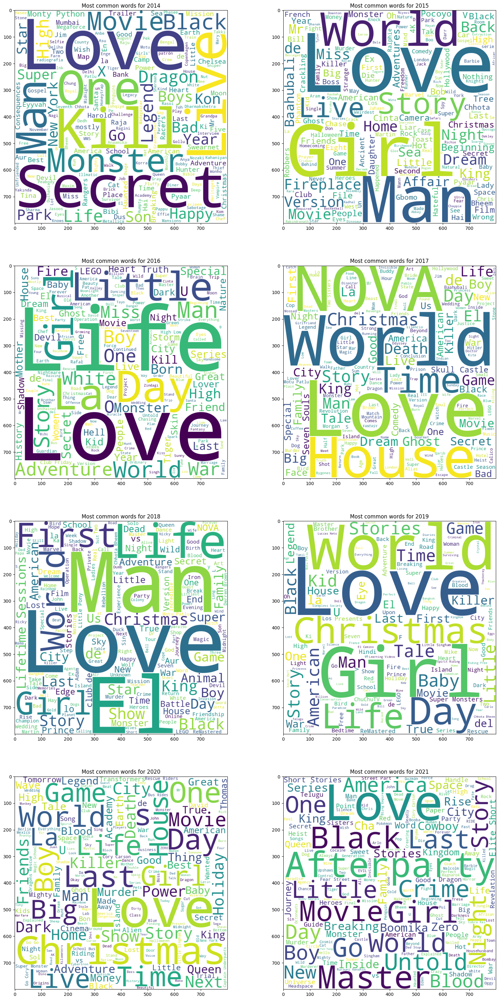

In [ ]:
# creates two subplots
fig, ax = plt.subplots(4, 2, figsize = (20, 40))

years=[i for i in range(2014,2022)]

# Plot without grid
for i in range(4):
  for j in range(2):
    titles = ' '.join(df[df['release_year']== years[(2*i)+j]]['title'])
    wordcloud = WordCloud(width = 800, height = 800,background_color ='white',
                stopwords = STOPWORDS,min_font_size = 10).generate(titles)
    ax[i,j].imshow(wordcloud)
    ax[i,j].set_title(f'Most common words for {years[(2*i)+j]}')


plt.show()

In [ ]:
import calendar

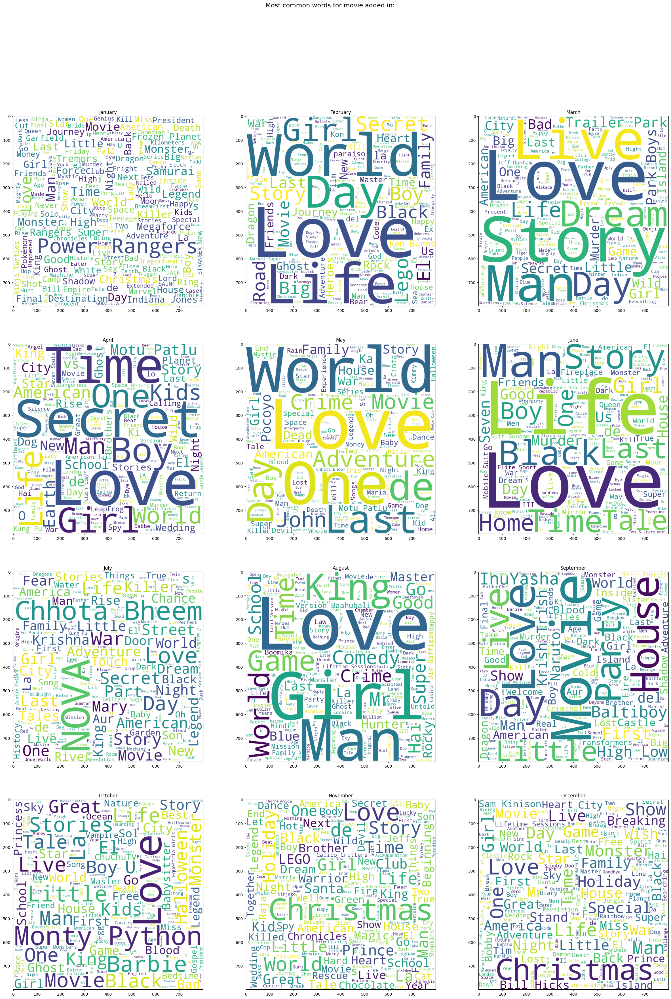

In [ ]:
# creates two subplots
fig, ax = plt.subplots(4, 3, figsize = (30, 40))
fig.suptitle("Most common words for movie added in:", fontsize=16)
months=[i for i in range(1,13)]

# Plot without grid
for i in range(4):
  for j in range(3):
    titles = ' '.join(df[df['date_added'].dt.month== months[(3*i)+j]]['title'])
    wordcloud = WordCloud(width = 800, height = 800,background_color ='white',
                stopwords = STOPWORDS,min_font_size = 10).generate(titles)
    ax[i,j].imshow(wordcloud)
    ax[i,j].set_title(f'{calendar.month_name[months[(3*i)+j]]}')

plt.show()

In [ ]:
df.country.value_counts()

United States                             2818
India                                      972
United Kingdom                             419
Japan                                      245
South Korea                                199
                                          ... 
Romania, Bulgaria, Hungary                   1
Uruguay, Guatemala                           1
France, Senegal, Belgium                     1
Mexico, United States, Spain, Colombia       1
United Arab Emirates, Jordan                 1
Name: country, Length: 748, dtype: int64


In [ ]:
df[df['country'].str.contains(',')==False]['country'].value_counts()[:21]

United States     2818
India              972
United Kingdom     419
Japan              245
South Korea        199
Canada             181
Spain              145
France             124
Mexico             110
Egypt              106
Turkey             105
Nigeria             95
Australia           87
Taiwan              81
Indonesia           79
Brazil              77
Philippines         75
Germany             67
China               66
Thailand            61
Argentina           56
Name: country, dtype: int64

In [ ]:
df[~df["col"].str.contains(word)]

In [ ]:
titles

''

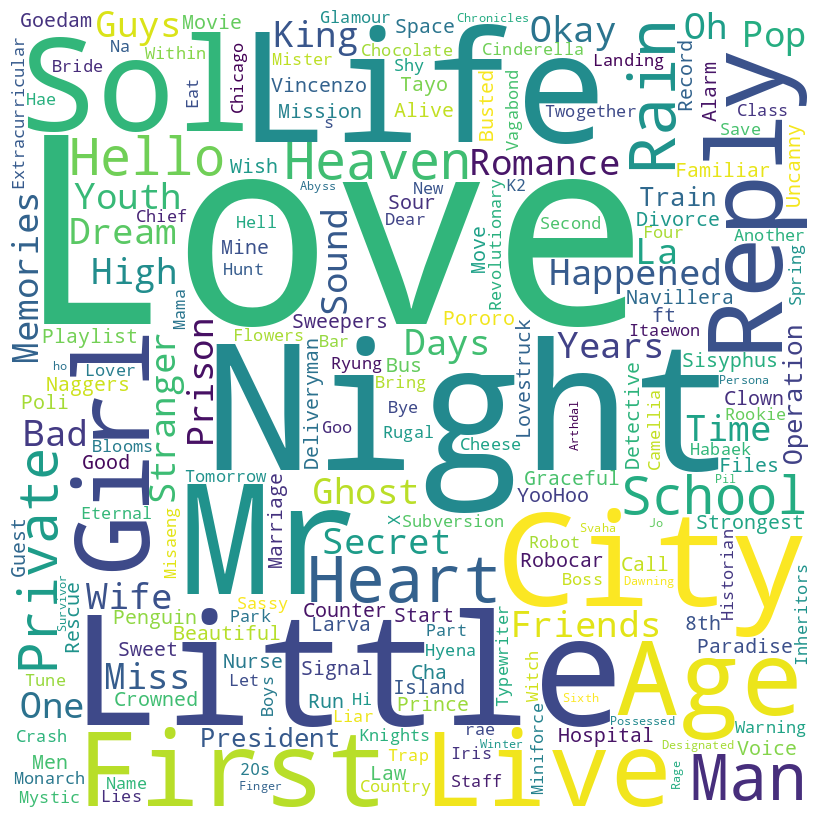

In [ ]:
titles = ' '.join(df[df['country']=='South Korea']['title'])
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = STOPWORDS,
                min_font_size = 10).generate(titles)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

In [ ]:
# country_df = df['country']
country_df = df[df['country'].str.contains(',')==False][['country','title']]
country_df = country_df.groupby('country')['title'].agg(lambda x: ' '.join(x)).reset_index()
new_df = country_df.sort_values(by='title', key=lambda x: x.str.len(), ascending=False).head(21)

In [333]:
new_df['country'] = new_df['country'].replace('United States', 'United States of America')
new_df.head()

,country,title
67,United States of America,Dick Johnson Is Dead The Starling Dear White P...
27,India,Kota Factory Jeans Chhota Bheem Dharmakshetra ...
66,United Kingdom,The Great British Baking Show Sex Education Nu...
32,Japan,InuYasha the Movie 2: The Castle Beyond the Lo...
10,Canada,Level 16 Between Kim's Convenience Some Assemb...


In [ ]:
import geopandas as gpd
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [330]:
merged_data = world.merge(new_df, left_on='name', right_on='country', how='right')

In [331]:
merged_data.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,country,title
0,3.282395e+08,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",United States of America,Dick Johnson Is Dead The Starling Dear White P...
1,1.366418e+09,Asia,India,IND,2868929,"POLYGON ((97.32711 28.26158, 97.40256 27.88254...",India,Kota Factory Jeans Chhota Bheem Dharmakshetra ...
2,6.683440e+07,Europe,United Kingdom,GBR,2829108,"MULTIPOLYGON (((-6.19788 53.86757, -6.95373 54...",United Kingdom,The Great British Baking Show Sex Education Nu...
3,1.262649e+08,Asia,Japan,JPN,5081769,"MULTIPOLYGON (((141.88460 39.18086, 140.95949 ...",Japan,InuYasha the Movie 2: The Castle Beyond the Lo...
4,3.758926e+07,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,Level 16 Between Kim's Convenience Some Assemb...


In [302]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors

# Define colors for each country using valid color names
flag_colors = {
    'United States of America': ['red', 'white', 'blue'],
    'India': ['darkorange', 'white', 'green'],
    'United Kingdom': ['red', 'white', 'blue'],
    'Japan': ['red', 'white'],
    'Canada': ['red', 'white'],
    'South Korea': ['red', 'white', 'blue'],
    'Spain': ['red', 'gold'],
    'Mexico': ['green', 'white', 'red'],
    'France': ['blue', 'white', 'red'],
    'Egypt': ['red', 'white', 'black'],
    'Turkey': ['red', 'white'],
    'Australia': ['blue', 'white'],
    'Nigeria': ['green', 'white'],
    'Brazil': ['green', 'yellow'],
    'Philippines': ['blue', 'white', 'red'],
    'Taiwan': ['red', 'blue'],
    'Indonesia': ['red', 'white'],
    'China': ['red', 'gold'],
    'Germany': ['black', 'red', 'gold'],
    'Argentina': ['lightblue', 'white'],
    'Thailand': ['red', 'white', 'blue']
}

#custom color map for each country
flag_colors_cmap = {country: ListedColormap(colors) for country, colors in flag_colors.items()}



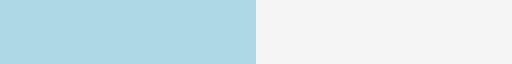

In [255]:
flag_colors_cmap['Argentina']

In [271]:
def get_mask(multipolygon_map):
  min_x, min_y, max_x, max_y = multipolygon_map.bounds
  x_resolution = 300
  y_resolution = 300

  # Create a grid of points within the bounding box
  x, y = np.meshgrid(np.linspace(min_x, max_x, x_resolution), np.linspace(min_y, max_y, y_resolution))
  points = np.column_stack((x.ravel(), y.ravel()))

  # Check if each point is within the MultiPolygon
  mask = [multipolygon_map.contains(Point(point)) for point in points]

  # Reshape the mask to match the resolution
  mask = np.array(mask).reshape(x_resolution, y_resolution)[::-1, :]

  # Invert the mask if needed
  mask = np.invert(mask)

  # Now 'mask' is a numpy array that can be used as a mask for your word cloud
  converted_mask = np.array(mask, dtype=np.uint8) * 255

  return converted_mask

In [317]:
def generate_wordcloud(data, country_name, bg_color='black' , mask=None):
    cloud = WordCloud(scale=3,
                      max_words=200,
                      colormap=flag_colors_cmap[country_name],
                      mask=mask,
                      background_color=bg_color,
                      stopwords=STOPWORDS,
                      contour_color='oldlace',
                      contour_width=1,
                      min_font_size = 0.5).generate_from_text(data)
    plt.figure(figsize=(10,8))
    plt.imshow(cloud)
    plt.axis('off')
    plt.title(country_name)
    # plt.show()
    plt.savefig(f'{country_name}.png')

In [272]:
merged_data['country_mask'] = merged_data.apply(lambda x: get_mask(x['geometry']), axis=1)

In [322]:
merged_data.head(21)

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,country,title,country_mask
0,3.282395e+08,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",United States of America,Dick Johnson Is Dead The Starling Dear White P...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
1,1.366418e+09,Asia,India,IND,2868929,"POLYGON ((97.32711 28.26158, 97.40256 27.88254...",India,Kota Factory Jeans Chhota Bheem Dharmakshetra ...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
2,6.683440e+07,Europe,United Kingdom,GBR,2829108,"MULTIPOLYGON (((-6.19788 53.86757, -6.95373 54...",United Kingdom,The Great British Baking Show Sex Education Nu...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
3,1.262649e+08,Asia,Japan,JPN,5081769,"MULTIPOLYGON (((141.88460 39.18086, 140.95949 ...",Japan,InuYasha the Movie 2: The Castle Beyond the Lo...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
4,3.758926e+07,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,Level 16 Between Kim's Convenience Some Assemb...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
5,5.170910e+07,Asia,South Korea,KOR,1646739,"POLYGON ((126.17476 37.74969, 126.23734 37.840...",South Korea,Tayo the Little Bus Pororo - The Little Pengui...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
6,4.707678e+07,Europe,Spain,ESP,1393490,"POLYGON ((-7.45373 37.09779, -7.53711 37.42890...",Spain,La casa de papel Valeria Sky Rojo Cleo & Cuqui...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
7,1.275755e+08,North America,Mexico,MEX,1268870,"POLYGON ((-117.12776 32.53534, -115.99135 32.6...",Mexico,Falsa identidad La diosa del asfalto Control Z...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
8,6.705989e+07,Europe,France,FRA,2715518,"MULTIPOLYGON (((-51.65780 4.15623, -52.24934 3...",France,The Women and the Murderer 2 Alone in Paris Go...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
9,1.003881e+08,Africa,Egypt,EGY,303092,"POLYGON ((36.86623 22.00000, 32.90000 22.00000...",Egypt,Return of the Prodigal Son Asmaa One Like It A...,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."


<ipython-input-317-b3e614dbc95c>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,8))


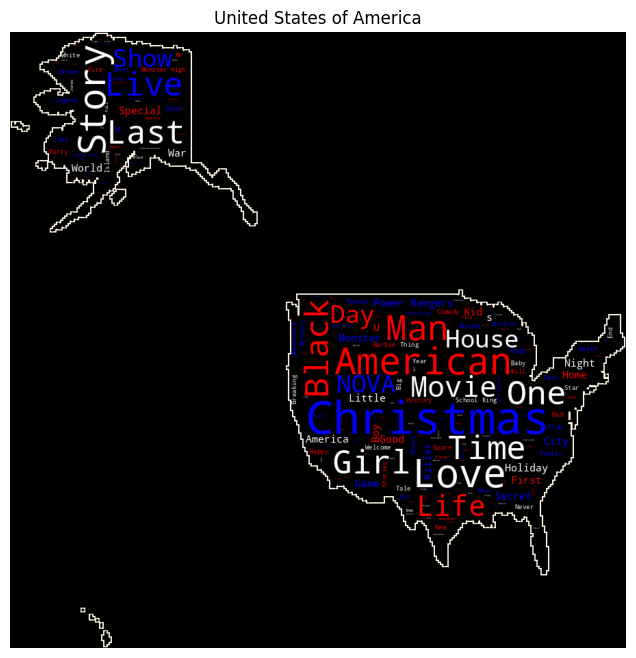

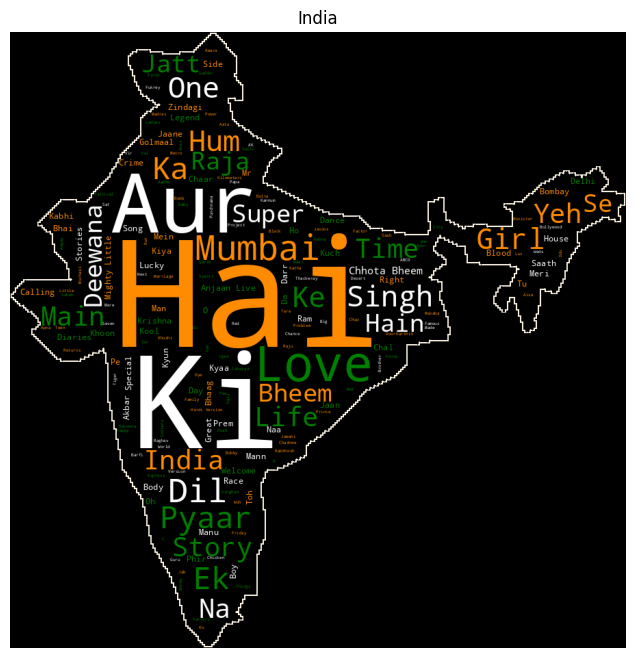

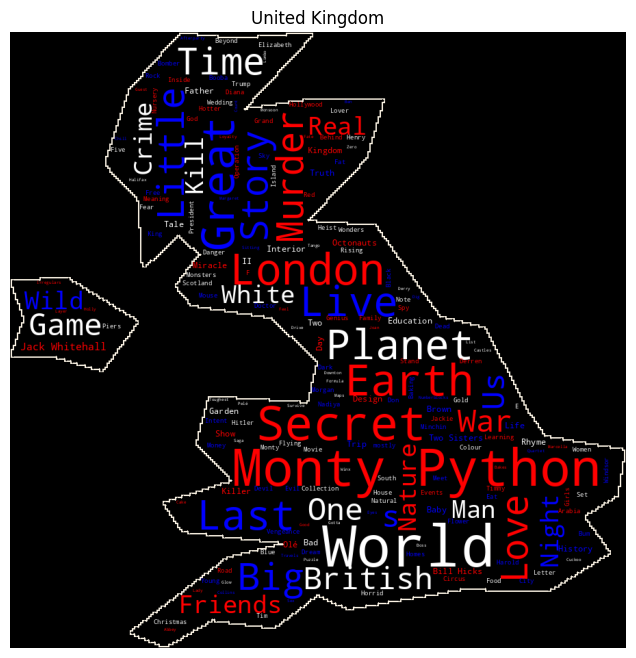

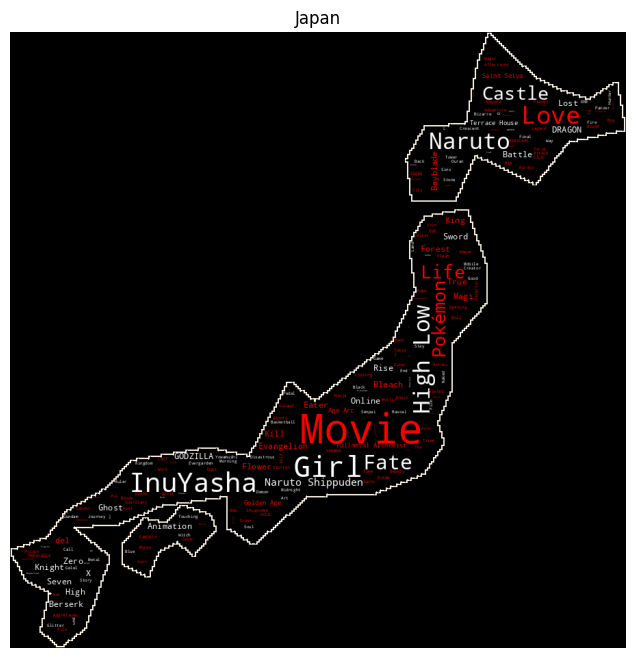

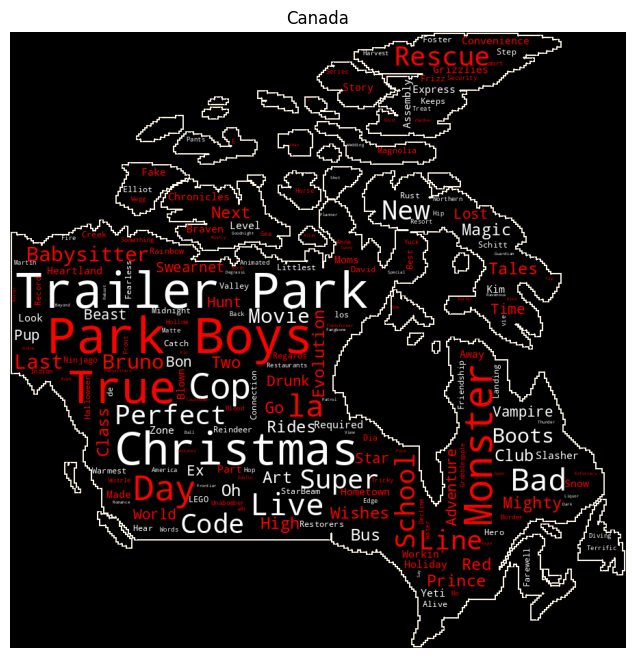

...

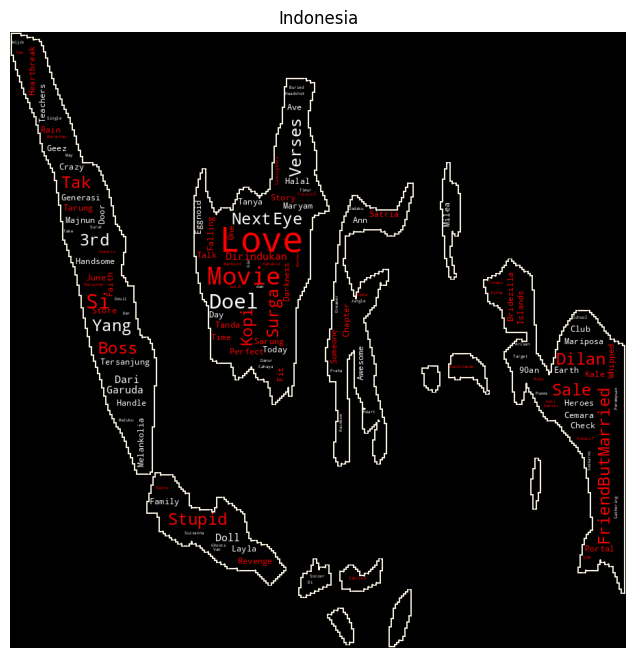

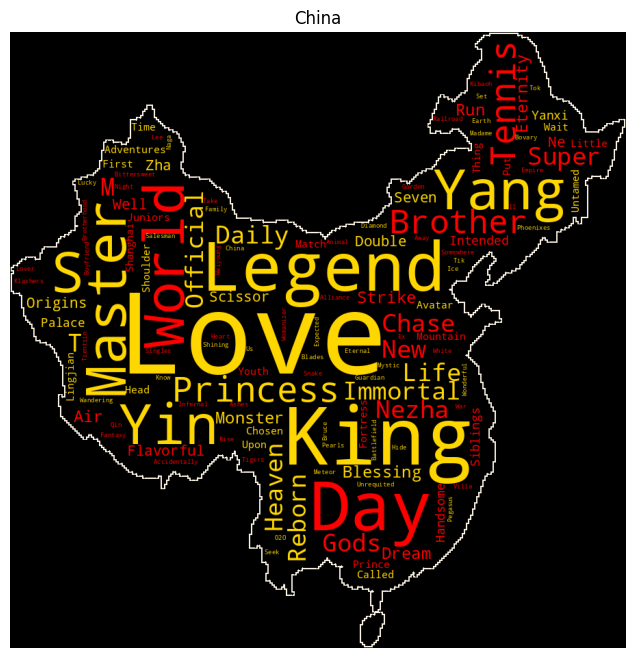

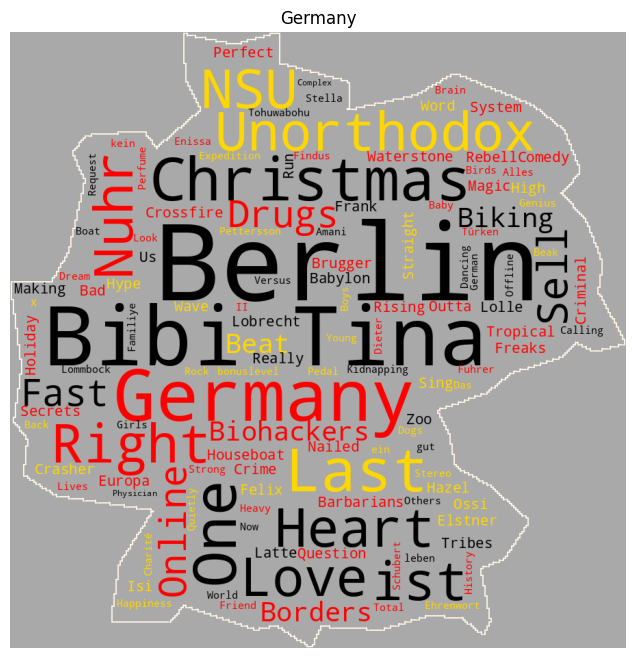

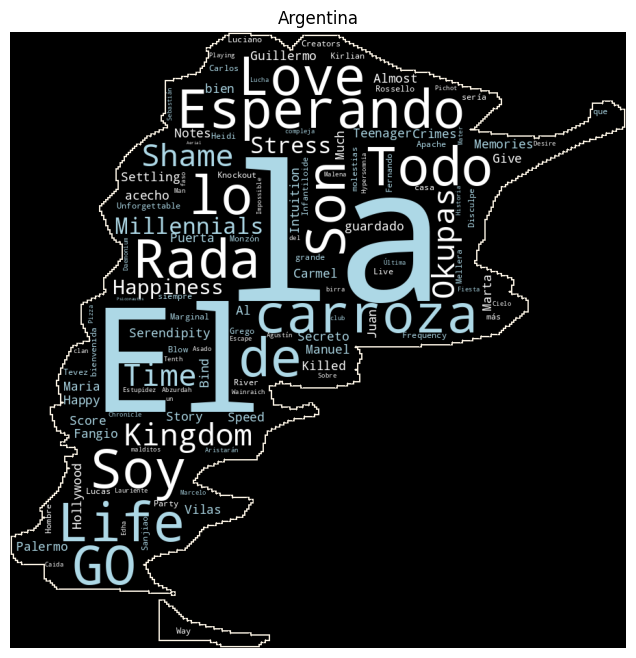

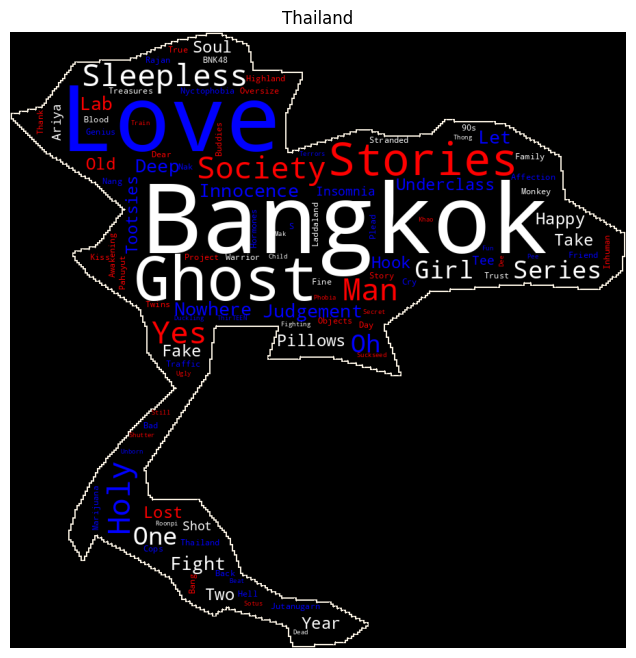

In [318]:
for index, row in merged_data.iterrows():
  if row['country'] in ["Germany","Egypt"]:
    generate_wordcloud(row['title'], row['country'], bg_color='darkgray' , mask=row['country_mask'])
  else:
    generate_wordcloud(row['title'], row['country'], mask=row['country_mask'])

In [321]:
#For France the map we had wasn't good enough so got mask differently
from PIL import Image
france_mask = np.array(Image.open('/content/france.jpg'))

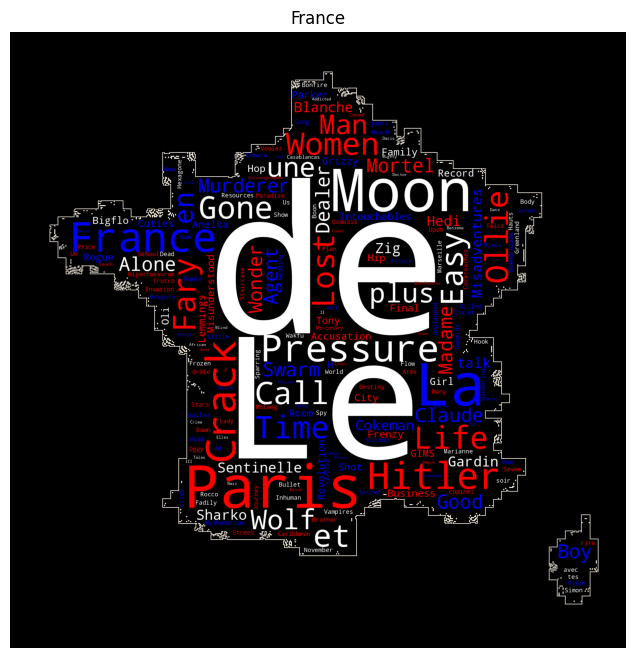

In [324]:
generate_wordcloud(merged_data.iat[8,7], 'France', bg_color='black' , mask=france_mask)

###Rough work

In [ ]:
USA_MAP = merged_data.iat[0, 5]

In [ ]:
import numpy as np
from shapely.geometry import Point
from matplotlib.path import Path

# Define the bounding box for the MultiPolygon
min_x, min_y, max_x, max_y = USA_MAP.bounds

# Define the resolution of your mask (e.g., 100x100 pixels)
x_resolution = 300
y_resolution = 300

# Create a grid of points within the bounding box
x, y = np.meshgrid(np.linspace(min_x, max_x, x_resolution), np.linspace(min_y, max_y, y_resolution))
points = np.column_stack((x.ravel(), y.ravel()))

# Check if each point is within the MultiPolygon
mask = [USA_MAP.contains(Point(point)) for point in points]

# Reshape the mask to match the resolution
mask = np.array(mask).reshape(x_resolution, y_resolution)[::-1, :]

# Invert the mask if needed
mask = np.invert(mask)

# Now 'mask' is a numpy array that can be used as a mask for your word cloud
converted_mask = np.array(mask, dtype=np.uint8) * 255



In [ ]:
mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [ ]:
converted_mask = np.array(mask, dtype=np.uint8) * 255

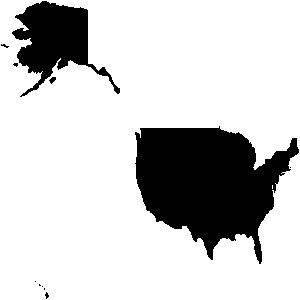

In [ ]:
from PIL import Image

# Convert the boolean mask to an integer array (0 or 255)
mask_image = np.array(mask, dtype=np.uint8) * 255

# Create a PIL image from the mask array
mask_image = Image.fromarray(mask_image)

# Display the image
mask_image

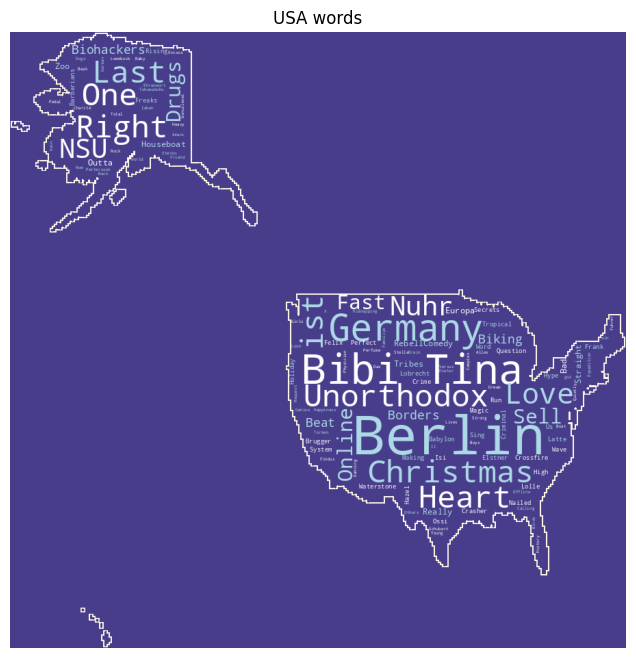

In [268]:
def generate_better_wordcloud(data, title, mask=None):
    cloud = WordCloud(scale=3,
                      max_words=200,
                      colormap=flag_colors_cmap['Argentina'],
                      mask=mask,
                      background_color='darkslateblue',
                      stopwords=STOPWORDS,
                      contour_color='oldlace',
                      contour_width=1,
                      min_font_size = 0.5).generate_from_text(data)
    plt.figure(figsize=(10,8))
    plt.imshow(cloud)
    plt.axis('off')
    plt.title(title)
    plt.show()

# Use the function with the rome_corpus and our mask to create word cloud
generate_better_wordcloud(merged_data.iat[18,7], 'USA words', mask=converted_mask)